# Neural style transfer. 
  
Rules of the task:
* no late submissions allowed 
* your ipynb file should be openable in Anytask directly (no external links, zip archives, etc.)
* your whole solution will not be graded
    * if github blocks of code are detected (except depth estimation network)
    * if equivalent blocks of code for several students are found (except depth estimation network)

Task consists of the following parts:
* part1 (7 points, if good visualization in part 3): program & train transformer network for fast style transfer [Johnson et al. 2016](https://arxiv.org/pdf/1603.08155.pdf) with minor changes for better performance:
    * replace batch normalization with instance normalization (don't forget that it should use **tunable** coefficients)
    * replace transposed convolutions with scaling and ordinary convolution
* part2 (5 points, if good visualization in part 3): augment it with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network from github and train it until convergence or use pretrained weights (give link to materials you used)
* part 3: visualization of the results (most important, it would show how well you made your models)
    * You should stylize **all** content images from images/contents using **any single style** from images/styles that you like more. So train your model in parts 1,2 to reproduce that particular style.
* optional part: any your ideas about style transfer improvement

In [ ]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [ ]:
from collections import namedtuple

import torch
import torch.nn as nn
from torchvision import models
import torch.optim as optim
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

from PIL import Image
import argparse
import os
import sys
import time
from datetime import datetime
import re
from IPython import display
import numpy as np
from pdb import set_trace as bp

!pip install catalyst

     |████████████████████████████████| 276kB 3.5MB/s 
     |████████████████████████████████| 194kB 48.6MB/s 
     |████████████████████████████████| 460kB 31.9MB/s 
     |████████████████████████████████| 61kB 26.4MB/s 
     |████████████████████████████████| 71kB 29.2MB/s 
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1


# Part 1 - fast style transfer

### Helpful functions

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
# !unzip val2017.zip -d "/content/drive/My Drive/style_transfer/images/mscoco"
!mkdir -p "./style_transfer/images/mscoco"
!wget http://images.cocodataset.org/zips/val2017.zip
!unzip val2017.zip -d "./style_transfer/images/mscoco"
!cp -rv "/content/drive/My Drive/style_transfer/contents" "/content/drive/My Drive/style_transfer/styles" .

In [ ]:
def gram_matrix(y): # returns matrix of cross products on layer y, divided by (height*weight*#channels)
    N, C, H, W = y.shape
    y_plane = y.view(N, C, H * W)
    gram = torch.matmul(y_plane, y_plane.transpose(1, 2))
    return gram / (H * W * C)

def normalize_batch(batch):
    # normalization before input to VGG, using imagenet mean and std. Input should be inside [0,1] interval.
    mean = batch.new_tensor([0.485, 0.456, 0.406]).view(1,-1, 1, 1)  # new tensor with the same dtyp`e and device as batch
    std = batch.new_tensor([0.229, 0.224, 0.225]).view(1,-1, 1, 1)   # .view(1,-1, 1, 1) makes [1,3,1,1] shape of tensor
    return (batch - mean) / std

### Vgg16

In [ ]:
class Vgg16(torch.nn.Module):
    def __init__(self, requires_grad=False):
        super(Vgg16, self).__init__()
        vgg_pretrained_features = models.vgg16(pretrained=True).features

        self.slice1 = torch.nn.Sequential()
        self.slice2 = torch.nn.Sequential()
        self.slice3 = torch.nn.Sequential()
        self.slice4 = torch.nn.Sequential()
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])

        # freezes all model parameters
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out

### StylizerNet

<img src="real-time-ST.gif">

In [ ]:
class ResidualBlock(torch.nn.Module):
    def __init__(self, num_channels=128):
        super().__init__()

        self.conv_1 = torch.nn.Conv2d(num_channels, num_channels, (3, 3), padding=1)
        self.inst_norm_1 = torch.nn.InstanceNorm2d(num_features=num_channels, affine=True)
        self.relu = torch.nn.ReLU()
        self.conv_2 = torch.nn.Conv2d(num_channels, num_channels, (3, 3), padding=1)
        self.inst_norm_2 = torch.nn.InstanceNorm2d(num_features=num_channels, affine=True)
    
    def forward(self, x):
        _conv_1 = self.conv_1(x)
        _inst_norm_1 = self.inst_norm_1(_conv_1)
        _relu = self.relu(_inst_norm_1)
        _conv_2 = self.conv_2(_relu)
        _inst_norm_2 = self.inst_norm_2(_conv_2)
        result = x + _inst_norm_2
        return result


In [ ]:
class ImageTransformNet(torch.nn.Module):
    def __init__(self):
        super().__init__()

        self.conv_block_1 = torch.nn.Sequential(
            # torch.nn.Conv2d(3,  32,  (9, 9), padding=4)
            torch.nn.Sequential(
                torch.nn.ReflectionPad2d(4),
                torch.nn.Conv2d(3, 32, (9, 9)),
            ),
            torch.nn.InstanceNorm2d(num_features=32, affine=True),
            torch.nn.ReLU(),
        )

        self.conv_block_2 = torch.nn.Sequential(
            torch.nn.Sequential(
                torch.nn.ReflectionPad2d(1),
                torch.nn.Conv2d(32, 64,  (3, 3), stride=(2, 2)),
            ),
            torch.nn.InstanceNorm2d(num_features=64, affine=True),
            torch.nn.ReLU(),
        )

        self.conv_block_3 = torch.nn.Sequential(
            torch.nn.Sequential(
                torch.nn.ReflectionPad2d(1),
                torch.nn.Conv2d(64, 128, (3, 3), stride=(2, 2)),
            ),
            torch.nn.InstanceNorm2d(num_features=128, affine=True),
            torch.nn.ReLU(),
        )

        self.residual_blocks = torch.nn.Sequential(
            # *[ResidualBlock(num_channels=128) for _ in range(5)]
            ResidualBlock(num_channels=128),
            ResidualBlock(num_channels=128),
            ResidualBlock(num_channels=128),
            ResidualBlock(num_channels=128),
            ResidualBlock(num_channels=128),
        )

        self.conv_block_4 = torch.nn.Sequential(
            # torch.nn.ConvTranspose2d(128, 64, (3, 3), stride=(2, 2), padding=1)
            torch.nn.Sequential(
                torch.nn.Upsample(scale_factor=2),
                torch.nn.ReflectionPad2d(1),
                torch.nn.Conv2d(128, 64, (3, 3)),
            ),
            torch.nn.InstanceNorm2d(num_features=64, affine=True),
            torch.nn.ReLU(),
        )

        self.conv_block_5 = torch.nn.Sequential(
            # torch.nn.ConvTranspose2d(64, 32, (3, 3), stride=(2, 2), padding=1)
            torch.nn.Sequential(
                torch.nn.Upsample(scale_factor=2),
                torch.nn.ReflectionPad2d(1),
                torch.nn.Conv2d(64, 32, (3, 3)),
            ),
            torch.nn.InstanceNorm2d(num_features=32, affine=True),
            torch.nn.ReLU(),
        )

        self.conv_final = torch.nn.Sequential(
            # torch.nn.Conv2d(32, 3, (9, 9), padding=4)
            torch.nn.Sequential(
                torch.nn.ReflectionPad2d(4),
                torch.nn.Conv2d(32, 3, (9, 9)),
            ),
            torch.nn.InstanceNorm2d(num_features=3, affine=True),
            torch.nn.Tanh(),
        )

    def forward(self, x):
        
        _conv_block_1 = self.conv_block_1(x)
        _conv_block_2 = self.conv_block_2(_conv_block_1)
        _conv_block_3 = self.conv_block_3(_conv_block_2)
        _residual_blocks = self.residual_blocks(_conv_block_3)
        _conv_block_4 = self.conv_block_4(_residual_blocks)
        _conv_block_5 = self.conv_block_5(_conv_block_4)
        _conv_final = self.conv_final(_conv_block_5)
        result = (_conv_final + 1) / 2
        return result


In [ ]:
class StylizerNet(torch.nn.Module):
    '''Here you should realize Image Transform Net - fig.2 from https://arxiv.org/pdf/1603.08155.pdf
    Its structure should be from https://cs.stanford.edu/people/jcjohns/papers/fast-style/fast-style-supp.pdf
    with 2 modifications: 
    1) batch normalizations should be substituted by instance normalizations with learnable parameters.
    See https://arxiv.org/pdf/1607.08022.pdf
    2) Transposed convolutions with stride 1/2 should be replaced by UpsampleConvLayer, which:
        a) upsamples image 2 times with nearest neighbour estimation - use torch.nn.Upsample
        b) performs reflection padding with pad=conv_kernel_size // 2
        c) applies conv with 3x3 kernel
    This method gives better results compared to ConvTranspose2d, see 
    http://distill.pub/2016/deconv-checkerboard/.
    
    Hint: use torch.nn.InstanceNorm2d with _trainable_ parameters mu, sigma
    '''

    def __init__(self, style_image):
        super().__init__()
        assert style_image.sum() > 0
        self.transform_net = ImageTransformNet()
        self.style = style_image
        
    def forward(self, x):
        transfered_image = self.transform_net(x)
        return transfered_image

    def get_style_image(self):
        return self.style


In [ ]:
class TVLoss(torch.nn.Module):
    # mean of squared differeces between each pixel and its neighbour from the right +
    # mean of squared differeces between each pixel and its neighbour from below
    def __init__(self):
        super().__init__()

    def forward(self, image):
        tv_x = ((image[:,:,:,:-1] - image[:,:,:,1:]) ** 2).mean()
        tv_y = ((image[:,:,:-1,:] - image[:,:,1:,:]) ** 2).mean()
        return tv_x + tv_y


In [ ]:
class StylizerNetLoss(torch.nn.Module):
    def __init__(self, style_image):
        super().__init__()

        self.style = style_image
        self.style_vgg = normalize_batch(self.style)
        self.loss_net = Vgg16(requires_grad=False).to(self.style_vgg.device)

        style_vgg_outputs = self.loss_net(self.style_vgg)  # fixed once
        style_gram = namedtuple("StyleGram", style_vgg_outputs._fields)
        self.style_gram = style_gram(*[gram_matrix(x) for x in style_vgg_outputs])
        self.tv_loss = TVLoss()

    def forward(self, transfered_image, x):
        import torch.nn.functional as F

        N, C, H, W = x.shape
        vgg_input = normalize_batch(x)  # content_target
        vgg_input_transfer = normalize_batch(transfered_image)

        # vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
        # out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)

        vgg_outputs = self.loss_net(vgg_input)
        vgg_outputs_transfer = self.loss_net(vgg_input_transfer)

        content_logits = getattr(vgg_outputs, "relu3_3")
        transfer_logits = getattr(vgg_outputs_transfer, "relu3_3")
        content_loss = F.mse_loss(content_logits, transfer_logits)

        gram_tuple = namedtuple("Gram", vgg_outputs._fields)
        transfer_gram = gram_tuple(*[gram_matrix(x) for x in vgg_outputs_transfer])

        style_loss_tuple = namedtuple("StyleLoss", self.style_gram._fields)
        # style_loss = style_loss_tuple(*[F.mse_loss(inp, stl, reduction="sum")
        style_loss = style_loss_tuple(*[F.mse_loss(inp, torch.cat([stl] * N, dim=0))
            for inp, stl in zip(transfer_gram, self.style_gram)])
        
        style_loss_sum = sum(style_loss)
        tv_loss = self.tv_loss(transfered_image)
        # loss = namedtuple("Loss", ["content_loss", "style_loss_sum", "tv_loss"])
        # return loss(content_loss, style_loss_sum, tv_loss)
        # return {"content_loss": content_loss, "style_loss_sum": style_loss_sum, "tv_loss": tv_loss}
        final_loss = content_loss + 100000 * style_loss_sum + 0.00001 * tv_loss
        # final_loss = content_loss + 0 * style_loss_sum + 0.00001 * tv_loss

        # print("content_loss:", content_loss, "style_loss:", 100000 * style_loss_sum, "tv_loss:", 0.00001 * tv_loss, end=' ')
        return final_loss


In [ ]:
from catalyst.dl.utils import get_device
def test_model(model_fn, loss_model_fn, device='cpu'):
    print("device", device)
    style_image = torch.rand([1, 3, 256, 256]).to(device)
    input_image = torch.rand([4, 3, 256, 256]).to(device)
    # print("ii", input_image.requires_grad)
    # print("si", style_image.requires_grad)
    
    model = model_fn(style_image).to(device)
    # print(model)
    # for param in model.parameters():
    #     print("mo", param.requires_grad)
    loss_model = loss_model_fn(style_image).to(device)
    # for param in loss_model.parameters():
    #     print("lm", param.requires_grad)

    transfered_image = model(input_image)
    print(transfered_image.shape)
    loss = loss_model(input_image, transfered_image)
    print(loss.shape)

device = get_device()
test_model(model_fn=StylizerNet, loss_model_fn=StylizerNetLoss, device=device)

lz4 not available, disabling compression. To install lz4, run `pip install lz4`.
wandb not available, to install wandb, run `pip install wandb`.


device cuda


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 178MB/s]


torch.Size([4, 3, 256, 256])
torch.Size([])


### Training procedure

In [ ]:
from catalyst import utils
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split
from skimage.io import imread


In [ ]:
class TransferDataset(Dataset):
    def __init__(self, images, transforms=None):
        self.images = images
        self.transforms = transforms

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = imread(self.images[idx])
        if len(image.shape) != 3:
            image = np.stack([image] * 3, axis=-1)
        result = {"image": image}
        if self.transforms is not None:
            result = self.transforms(**result)
        return result


In [ ]:
# !conda install albumentations -y

In [ ]:
# Pipeline code is partially taken from https://github.com/catalyst-team/catalyst/blob/master/examples/notebooks/segmentation-tutorial.ipynb

import albumentations as A
from albumentations.pytorch import ToTensor

def pre_transforms(image_size=256):
    return [A.Resize(image_size, image_size, p=1)]
    
def resize_transforms(image_size=256):
    pre_size = int(image_size * 1.5)

    random_crop = A.Compose([
        A.SmallestMaxSize(pre_size, p=1),
        A.RandomCrop(
            image_size, image_size, p=1
        )
    ])

    # rescale = A.Compose([A.Resize(image_size, image_size, p=1)])
    rescale = A.Resize(image_size, image_size, p=1)

    random_crop_big = A.Compose([
        A.LongestMaxSize(pre_size, p=1),
        A.RandomCrop(
            image_size, image_size, p=1
        )
    ])

    result = [
        A.OneOf([
            random_crop,
            rescale,
            # random_crop_big
        ], p=1)
    ]
    return result

def hard_transforms():
    result = [
        A.RandomRotate90(),
        A.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.3
        ),
        A.GridDistortion(p=0.3),
        A.HueSaturationValue(p=0.3)
    ]

    return result

def post_transforms():
    return [ToTensor()]

def compose(transforms_to_compose):    
    result = A.Compose([
        item for sublist in transforms_to_compose for item in sublist
    ])
    return result

train_transforms = compose([[A.SmallestMaxSize(256, p=1)], resize_transforms(image_size=256), hard_transforms(), post_transforms()])
valid_transforms = compose([pre_transforms(image_size=256), post_transforms()])


In [ ]:
from pathlib import Path

SEED = 0
ROOT = Path("/content/drive/My Drive/style_transfer")
# ROOT = Path("./style_transfer")
images = ROOT / "images"
mscoco_path = images / "mscoco" / "val2017"
style_image_path = images / "styles" / "aqua.png"
root_logdir = ROOT / "logdir"

In [67]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
all_images = sorted(mscoco_path.glob("*.jpg"))
# train_images, test_images = train_test_split(all_images, random_state=SEED, train_size=0.9)
train_images = all_images
test_images = sorted((images / "contents").glob("*.jpg"))

In [ ]:
def get_data_loaders(images,
    valid_size=0.2, batch_size=4, num_workers=4,
    train_transforms=None, valid_transforms=None):

    from collections import OrderedDict

    indices = np.arange(len(images))
    train_indices, valid_indices = train_test_split(
        indices, test_size=valid_size, random_state=SEED, shuffle=True
    )
    np_images = np.array(images)

    train_dataset = TransferDataset(
        images=np_images[train_indices],
        transforms=train_transforms
    )
    valid_dataset = TransferDataset(
        images=np_images[valid_indices],
        transforms=valid_transforms
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers
    )
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers
    )
    
    loaders = OrderedDict()
    loaders["train"] = train_loader
    loaders["valid"] = valid_loader
    return loaders

In [ ]:
from catalyst.dl.utils import get_device
def train(stylizer, loaders, log_sfx,
          num_epochs=12, criterion=None,
          callbacks=[], device=get_device(),
          resume_checkpoint_sfx="", only_load_checkpoint_sfx=""):
    '''Training: refer to lectures for details
    loss function - sum of the 3 losses below: 
    content loss - default mse_loss between relu3_3 representations of vgg class above
    style loss - (sum of default mse_losses)*100000, mse_losses measure deviations of 
                 gramm matrices from their target values
                 for all output representations of vgg class above
    total variation loss: 0.00001*(mean of squared differeces between each pixel and its neighbour from the right+
                                   mean of squared differeces between each pixel and its neighbour from below).
    Content images taken from MS COCO valiadation 2017 dataset: http://cocodataset.org/#download
    You need to train on 60000 images (12 epochs). Each content image should be resized & cropped to 256x256 size. Style size should be original.
    Algorithm-Adam with lr=0.001. Use minibatch learning for speed.
    This is a simplified v    ersion of training from https://arxiv.org/pdf/1603.08155.pdf.
    '''

    from catalyst.dl import SupervisedRunner
    from catalyst.utils.checkpoint import load_checkpoint, unpack_checkpoint

    logdir = root_logdir / log_sfx
    style_image = stylizer.get_style_image()
    optimizer = torch.optim.Adam(stylizer.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=1)
    runner = SupervisedRunner(device=device, input_key="image", input_target_key="image")

    checkpoint_data = None
    # state_kwargs = None
    resume=None

    if only_load_checkpoint_sfx:
        ckpt_path = root_logdir / only_load_checkpoint_sfx[0] / "checkpoints" / only_load_checkpoint_sfx[1]
        print("Loading model params from checkpoint", ckpt_path)
        checkpoint_data = load_checkpoint(ckpt_path)
        unpack_checkpoint(checkpoint_data, model=stylizer)

    elif resume_checkpoint_sfx:
        resume = root_logdir / resume_checkpoint_sfx[0] / "checkpoints" / resume_checkpoint_sfx[1]
        print("Resuming training at checkpoint", resume)

    runner.train(
        model=stylizer,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=scheduler,
        loaders=loaders,
        callbacks=callbacks,
        logdir=logdir,
        num_epochs=num_epochs,
        checkpoint_data=checkpoint_data,
        resume=resume,
        verbose=True,
    )

In [ ]:
import torchvision.utils
from catalyst.dl.core import Callback, CallbackOrder, RunnerState
from tensorboardX import SummaryWriter

class VisualizationCallback(Callback):
    TENSORBOARD_LOGGER_KEY = "tensorboard"

    def __init__(self, denorm=False):
        super().__init__(CallbackOrder.Other)
        self.denorm = denorm

    @staticmethod
    def _get_tensorboard_logger(state: RunnerState) -> SummaryWriter:
        tb_key = VisualizationCallback.TENSORBOARD_LOGGER_KEY
        if (
            tb_key in state.loggers
            and state.loader_name in state.loggers[tb_key].loggers
        ):
            return state.loggers[tb_key].loggers[state.loader_name]
        raise RuntimeError(
            f"Cannot find Tensorboard logger for loader {state.loader_name}"
        )

    def compute_visualizations(self, state):
        original = state.input['image'].detach().cpu()
        stylized = state.output['logits'].detach().cpu()
        if self.denorm:
            original = (original * torch.tensor([0.229, 0.224, 0.225]).reshape((3, 1, 1)) + \
                         torch.tensor([0.485, 0.456, 0.406]).reshape((3, 1, 1)))
            stylized = (stylized * torch.tensor([0.229, 0.224, 0.225]).reshape((3, 1, 1)) + \
                         torch.tensor([0.485, 0.456, 0.406]).reshape((3, 1, 1)))
        original = torch.clamp(original, 0., 1.)  # ?
        stylized = torch.clamp(stylized, 0., 1.)  # ?
        
        viz_name = "/".join(['original', 'stylized'])
        viz_tensor = torch.cat((original, stylized), dim=3)

        return {viz_name: viz_tensor}

    def save_visualizations(self, state, visualizations):
        tb_logger = self._get_tensorboard_logger(state)
        for key, batch_images in visualizations.items():
            batch_images = batch_images[:3]
            image = torchvision.utils.make_grid(batch_images, nrow=1)
            tb_logger.add_image(key, image, global_step=state.step)

    def visualize(self, state):
        visualizations = self.compute_visualizations(state)
        self.save_visualizations(state, visualizations)

    def on_loader_end(self, state: RunnerState):
        self.visualize(state)

In [ ]:
def start_tb(log_sfx):
    %load_ext tensorboard
    logdir = root_logdir / log_sfx
    logdir = '\ '.join(str(logdir).split(' '))
    %tensorboard --logdir {logdir}

In [ ]:
from catalyst.dl.callbacks import CriterionCallback, CriterionAggregatorCallback
from collections import OrderedDict
style_image = imread(style_image_path)
# plt.imshow(style_image)
# plt.show()

if style_image.shape[-1] == 4:
    style_image = style_image[:,:,:-1]

device = get_device()
style_tensor = transforms.ToTensor()(style_image)[None,:]
style_tensor = style_tensor.to(device)
stylizer = StylizerNet(style_tensor)
stylizer = stylizer.to(device)
loaders = get_data_loaders(
    train_images,
    # train_images[:100],
    train_transforms=train_transforms,
    valid_transforms=valid_transforms,
    batch_size=8,
)
log_sfx = "log_regular"

criterion = {
    "stylizer_loss": StylizerNetLoss(stylizer.get_style_image())
}

callbacks = {
    "Criterion": CriterionCallback(
        input_key="image",
        prefix="loss",
        criterion_key="stylizer_loss",
    ),
    "Visualization": VisualizationCallback(denorm=False),
}
callbacks = OrderedDict(callbacks.items())

In [ ]:
# !ls {'\ '.join(str(root_logdir).split(' '))}
# !rm -rf {'\ '.join(str(root_logdir / log_sfx).split(' '))}
!cp -r {'\ '.join(str(root_logdir / "log1").split(' '))} {'\ '.join(str(root_logdir / "log").split(' '))}_regular
# !mv {'\ '.join(str(root_logdir / log_sfx).split(' '))} {'\ '.join(str(root_logdir / "log_regular").split(' '))}

In [ ]:
# log_sfx = "log0"
start_tb("log_regular")

In [ ]:
train(stylizer, loaders, log_sfx, num_epochs=5, callbacks=callbacks, criterion=criterion, device=device, resume_checkpoint_sfx=["log1", "last_full.pth"])
# train(stylizer, loaders, log_sfx, num_epochs=5, callbacks=callbacks, criterion=criterion, device=device)

Resuming training at checkpoint /content/drive/My Drive/style_transfer/logdir/log1/checkpoints/last_full.pth
=> loading checkpoint /content/drive/My Drive/style_transfer/logdir/log1/checkpoints/last_full.pth
loaded checkpoint /content/drive/My Drive/style_transfer/logdir/log1/checkpoints/last_full.pth (epoch 15)
0/5 * Epoch (train): 100% 500/500 [10:46<00:00,  1.28s/it, _timers/_fps=24.776, loss=17.476]
0/5 * Epoch (valid): 100% 125/125 [02:13<00:00,  1.25s/it, _timers/_fps=4.651, loss=16.786]
[2019-10-21 07:50:11,057] 
0/5 * Epoch 15 (train): _base/lr=0.0010 | _base/momentum=0.9000 | _timers/_fps=24.8090 | _timers/batch_time=0.3290 | _timers/data_time=0.3207 | _timers/model_time=0.0081 | loss=16.0447
0/5 * Epoch 15 (valid): _base/lr=0.0010 | _base/momentum=0.9000 | _timers/_fps=341.3495 | _timers/batch_time=0.4818 | _timers/data_time=0.4721 | _timers/model_time=0.0096 | loss=16.7749
1/5 * Epoch (train): 100% 500/500 [10:44<00:00,  1.29s/it, _timers/_fps=24.203, loss=15.208]
1/5 * Epoc

# Part 2 - depth-aware fast style transfer

Augment Gatys loss with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network and train it until convergence or use 
    pretrained weights (give link to model/weights if you used public model/weights)

In [ ]:
!git clone https://github.com/nianticlabs/monodepth2.git
sys.path.append("monodepth2")

Cloning into 'monodepth2'...
remote: Enumerating objects: 135, done.
remote: Total 135 (delta 0), reused 0 (delta 0), pack-reused 135
Receiving objects: 100% (135/135), 10.25 MiB | 26.18 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [ ]:
import networks
from utils import download_model_if_doesnt_exist

In [ ]:
class StylizerNetLossWithDepth(torch.nn.Module):
    def __init__(self, style_image, model_name="mono_640x192"):
        super().__init__()

        self.style = style_image
        self.regular_stylizer_loss = StylizerNetLoss(style_image)
        device = style_image.device
        download_model_if_doesnt_exist(model_name)
        encoder_path = os.path.join("models", model_name, "encoder.pth")
        depth_decoder_path = os.path.join("models", model_name, "depth.pth")

        # LOADING PRETRAINED MODEL
        self.encoder = networks.ResnetEncoder(18, False)
        self.depth_decoder = networks.DepthDecoder(num_ch_enc=self.encoder.num_ch_enc, scales=range(4))

        # loaded_dict_enc = torch.load(encoder_path, map_location='cpu')
        loaded_dict_enc = torch.load(encoder_path, map_location=device)
        filtered_dict_enc = {k: v for k, v in loaded_dict_enc.items() if k in self.encoder.state_dict()}
        self.encoder.load_state_dict(filtered_dict_enc)

        loaded_dict = torch.load(depth_decoder_path, map_location=device)
        self.depth_decoder.load_state_dict(loaded_dict)

        self.encoder.eval().to(device)
        self.depth_decoder.eval().to(device)

        self.depth_model = lambda x: self.depth_decoder(self.encoder(x))

    def forward(self, transfered_image, x):
        import torch.nn.functional as F

        N, C, H, W = x.shape
        inp_depth_transfered = F.interpolate(transfered_image, size=(640, 192), mode='bilinear', align_corners=False)
        inp_depth_x = F.interpolate(x, size=(640, 192), mode='bilinear', align_corners=False)
        regular_loss = self.regular_stylizer_loss(transfered_image, x)
        estimated_depth_x = self.depth_model(inp_depth_x)
        # print(type(estimated_depth_x), type(next(estimated_depth_x)))
        estimated_depth_trasnfered = self.depth_model(inp_depth_transfered)
        depth_losses = [F.mse_loss(d_x[1], d_t[1]) for d_x, d_t in zip(estimated_depth_x.items(), estimated_depth_trasnfered.items())]
        depth_loss = sum(depth_losses)
        final_loss = 100 * depth_loss + regular_loss
        
        # print("depth_loss:", 200 * depth_loss)
        # print("inp_depth.shape", inp_depth_x.shape)
        return final_loss


In [ ]:
test_model(model_fn=StylizerNet, loss_model_fn=StylizerNetLossWithDepth, device=device)

### Train your model

In [ ]:
from catalyst.dl.callbacks import CriterionCallback, CriterionAggregatorCallback
from collections import OrderedDict
# from catalyst.dl.callbacks.logging import TensorboardLogger
style_image = imread(style_image_path)
# plt.imshow(style_image)
# plt.show()

if style_image.shape[-1] == 4:
    style_image = style_image[:,:,:-1]

device = get_device()
style_tensor = transforms.ToTensor()(style_image)[None,:]
style_tensor = style_tensor.to(device)
stylizer = StylizerNet(style_tensor)
stylizer = stylizer.to(device)
loaders = get_data_loaders(
    train_images,
    # train_images[:100],
    train_transforms=train_transforms,
    valid_transforms=valid_transforms,
    batch_size=8,
)
# log_sfx = "log_depth"
log_sfx = "log_depth_from_scratch"


criterion = {
    # "stylizer_loss": StylizerNetLoss(stylizer.get_style_image()),
    # "stylizer_loss": StylizerNetLossWithDepth(stylizer.get_style_image()),
    "stylizer_loss_w_depth": StylizerNetLossWithDepth(stylizer.get_style_image()),
}

callbacks = {
    "Criterion": CriterionCallback(
        input_key="image",
        # prefix="loss_bce1",
        prefix="loss",
        criterion_key="stylizer_loss_w_depth",
        # criterion_key="stylizer_loss",
        # output_key="result_logits"
        # output_key="content_loss"
    ),
    "Visualization": VisualizationCallback(denorm=False),
}
callbacks = OrderedDict(callbacks.items())

-> Downloading pretrained model to models/mono_640x192.zip
   Unzipping model...
   Model unzipped to models/mono_640x192


In [ ]:
# !rm -rf {'\ '.join(str(root_logdir / log_sfx).split(' '))}

In [32]:
start_tb(log_sfx)


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 380), started 7:45:08 ago. (Use '!kill 380' to kill it.)

In [28]:
# train(stylizer, loaders, log_sfx, num_epochs=10, callbacks=callbacks, device=device, criterion=criterion, only_load_checkpoint_sfx=["log_regular", "best_full.pth"])
# train(stylizer, loaders, log_sfx, num_epochs=20, callbacks=callbacks, device=device, criterion=criterion)
train(stylizer, loaders, "log_depth_from_scratch", num_epochs=20, callbacks=callbacks, device=device, criterion=criterion)


0/20 * Epoch (train): 100% 500/500 [20:39<00:00,  2.47s/it, _timers/_fps=24.017, loss=31.584]
0/20 * Epoch (valid): 100% 125/125 [02:14<00:00,  1.00s/it, _timers/_fps=452.851, loss=37.085]
[2019-10-21 09:08:48,075] 
0/20 * Epoch 0 (train): _base/lr=0.0010 | _base/momentum=0.9000 | _timers/_fps=24.1222 | _timers/batch_time=0.3410 | _timers/data_time=0.3322 | _timers/model_time=0.0085 | loss=51.1084
0/20 * Epoch 0 (valid): _base/lr=0.0010 | _base/momentum=0.9000 | _timers/_fps=452.5080 | _timers/batch_time=0.0924 | _timers/data_time=0.0813 | _timers/model_time=0.0110 | loss=38.0559
1/20 * Epoch (train): 100% 500/500 [20:37<00:00,  2.47s/it, _timers/_fps=24.066, loss=35.202]
1/20 * Epoch (valid): 100% 125/125 [02:05<00:00,  1.00s/it, _timers/_fps=438.225, loss=35.203]
[2019-10-21 09:31:34,117] 
1/20 * Epoch 1 (train): _base/lr=0.0010 | _base/momentum=0.9000 | _timers/_fps=24.2314 | _timers/batch_time=0.3306 | _timers/data_time=0.3224 | _timers/model_time=0.0079 | loss=32.5997
1/20 * Epoch

In [ ]:
# stylizer = StylizerNet(style_tensor)
# stylizer = stylizer.to(device)

# Demo part

Visualize selected style image and a grid of 6x3 images I(i,j).
* I(i,1) is content number i from images/contents
* I(i,2) is stylization using depth unaware style transfer
* I(i,3) is stylization using depth aware style transfer

This is the most important part of your homework. Make sure you get 
stylizations of good quality in a convinient to view resolution.

In [ ]:
test_dataset = TransferDataset(
    test_images,
    transforms=valid_transforms
)

infer_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=4
)

In [ ]:
style_tensor = transforms.ToTensor()(style_image)[None,:]
style_tensor = style_tensor.to(device)
stylizer = StylizerNet(style_tensor)
stylizer = stylizer.to(device)
logdir_regular = root_logdir / "log_regular"
logdir_with_depth = root_logdir / "log_depth_from_scratch"

In [ ]:
from catalyst.dl import SupervisedRunner

runner = SupervisedRunner(device=device, input_key="image", input_target_key="image")

predictions_regular = runner.predict_loader(
    model=stylizer,
    loader=infer_loader,
    resume=f"{logdir_regular}/checkpoints/best.pth",
    verbose=True,
)
predictions_with_depth = runner.predict_loader(
    model=stylizer,
    loader=infer_loader,
    resume=f"{logdir_with_depth}/checkpoints/best.pth",
    verbose=True,
)

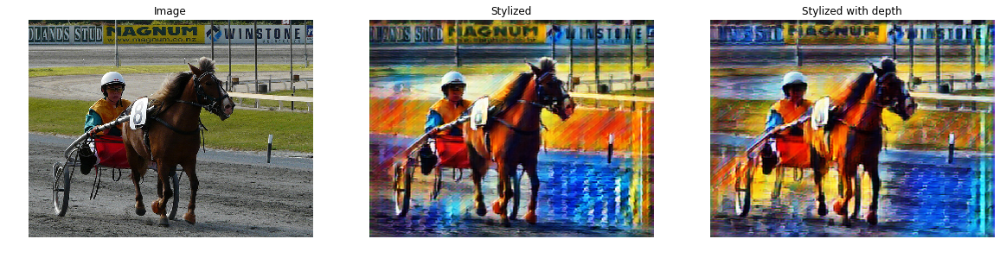

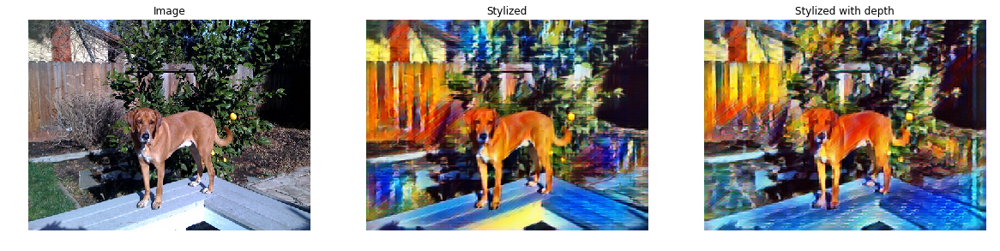

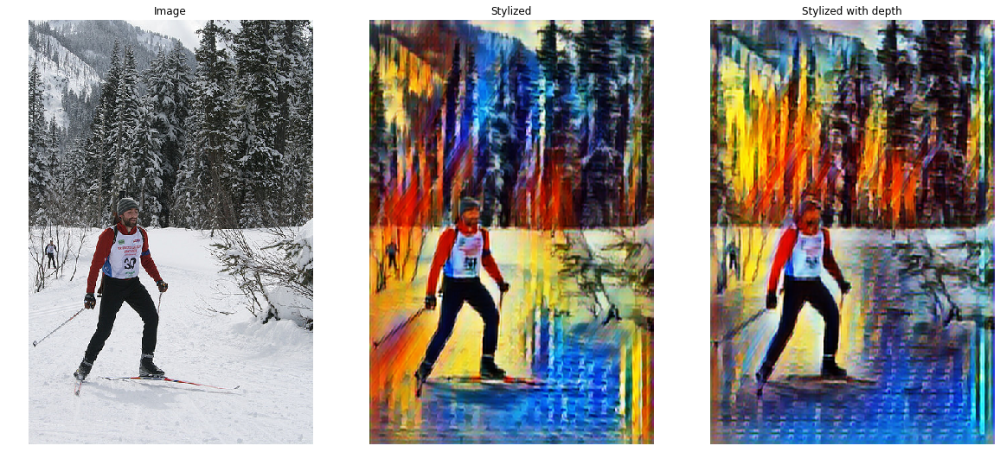

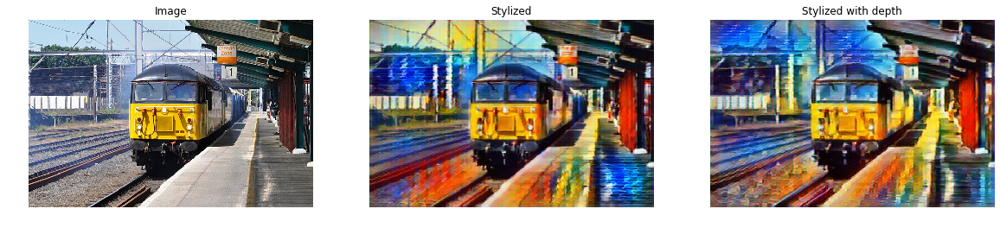

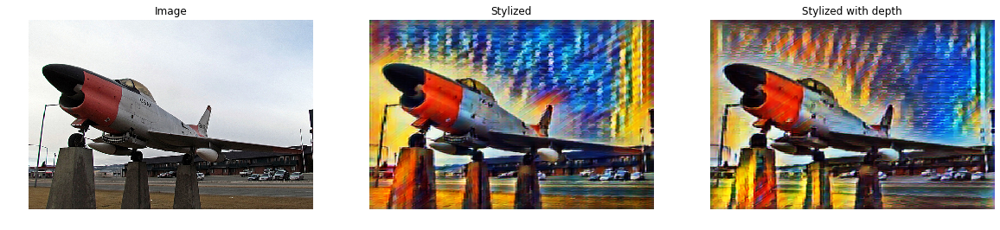

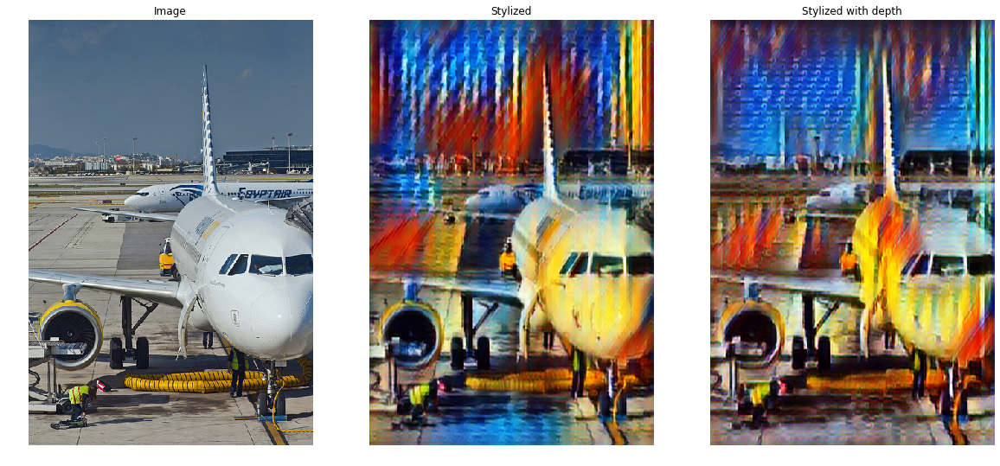

In [54]:
from matplotlib import pyplot as plt
def detach(tensor):
    return tensor.detach().cpu().numpy()

def show_example(image, stylized_regular_image, stylized_with_depth_image):
    import cv2
    h, w, c = image.shape
    
    plt.figure(figsize=(20, 30))
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(image)
    plt.title("Image")

    plt.subplot(1, 3, 2)
    stylized_regular_image = cv2.resize(stylized_regular_image, (w, h), interpolation=cv2.INTER_LANCZOS4)
    stylized_regular_image = np.clip(stylized_regular_image, 0., 1.)

    plt.axis('off')
    plt.imshow(stylized_regular_image)
    plt.title("Stylized")

    plt.subplot(1, 3, 3)
    stylized_with_depth_image = cv2.resize(stylized_with_depth_image, (w, h), interpolation=cv2.INTER_LANCZOS4)
    stylized_with_depth_image = np.clip(stylized_with_depth_image, 0., 1.)
    plt.axis('off')
    plt.imshow(stylized_with_depth_image)
    plt.title("Stylized with depth")


for test_image, stylized_regular, stylized_with_depth in zip(test_images, predictions_regular, predictions_with_depth):
    image = plt.imread(test_image)
    # stylized_regular = detach(stylized_regular)
    stylized_regular_image = np.transpose(stylized_regular, (1, 2, 0))
    # stylized_with_depth = detach(stylized_with_depth)
    stylized_with_depth_image = np.transpose(stylized_with_depth, (1, 2, 0))

    show_example(image, stylized_regular_image, stylized_with_depth_image)


# Optional part
any your ideas (you may write in Russian) on style transfer (any of the models we studied) improvement.